In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import tensorflow as tf
flags = tf.app.flags
FLAGS = flags.FLAGS


%matplotlib inline
import matplotlib.pyplot as plt

#from IPython.display import Image
from PIL import Image
from matplotlib.pyplot import imshow
import numpy as np

def image_show(image_path):
  imshow(np.asarray(Image.open(image_path, 'r')))
  plt.show()

In [2]:
%%html
<style>
.output_wrapper, .output {
    height:auto !important;
    max-height:100000px;  /* your desired max-height here */
}
.output_scroll {
    box-shadow:none !important;
    webkit-box-shadow:none !important;
}
</style>

In [3]:
import sys, os
from deepiu.util.text_predictor import TextPredictor
from deepiu.util.sim_predictor import SimPredictor
from deepiu.util import text2ids
import melt, gezi
import numpy as np 
import traceback

try:
  import conf
  from conf import TEXT_MAX_WORDS
except Exception:
  from deepiu.image_caption.conf import TEXT_MAX_WORDS

image_dir = '/home/gezi/data2/data/ai_challenger/image_caption/pic/'
image_file = '6275b5349168ac3fab6a493c509301d023cf39d3.jpg'

image_model_checkpoint_path = '/home/gezi/data/image_model_check_point/inception_resnet_v2_2016_08_30.ckpt'

model_dir = '/home/gezi/mount/temp/image-caption/ai-challenger/model.v5/mil.scene.finetune/'
vocab_path = '/home/gezi/mount/temp/image-caption/ai-challenger/tfrecord/seq-basic/vocab.txt'
valid_dir = '/home/gezi/mount/temp/image-caption/ai-challenger/tfrecord/seq-basic/valid'


image_model_name = melt.get_imagenet_from_checkpoint(image_model_checkpoint_path).name
image_model = None
if not melt.varname_in_checkpoint(image_model_name, model_dir):
  image_model = melt.image.ImageModel(image_model_checkpoint_path, 
                                      feature_name='attention')
  
    
print('image_model:', image_model)

text2ids.init(vocab_path)
vocab = text2ids.vocab

predictor = SimPredictor(model_dir,  
                         image_model=image_model,
                         index=-1)

text_strs = np.load(os.path.join(valid_dir, 'distinct_text_strs.npy'))
img2text = np.load(os.path.join(valid_dir, 'img2text.npy')).item()

tensorflow_version: 1.4.0


image_model: None
INFO:tensorflow:Initializing vocabulary from file: /home/gezi/mount/temp/image-caption/ai-challenger/tfrecord/seq-basic/vocab.txt
INFO:tensorflow:Created vocabulary with 10148 words


ENCODE_UNK 1
load frozen graph from /home/gezi/mount/temp/image-caption/ai-challenger/model.v5/mil.scene.finetune/model.ckpt-2.21-14500.pb with mapfile /home/gezi/mount/temp/image-caption/ai-challenger/model.v5/mil.scene.finetune/model.ckpt-2.21-14500.map duration: 5.42467689514


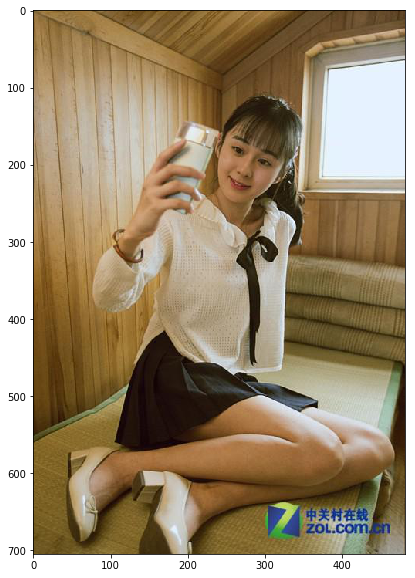

topwords of image  42195bece99b2263aefa8a1fcbc11aa684e4fdf0.jpg
0 室内 0.490367|1 卧室 0.471572|2 展厅 0.430609|3 室 0.427262|4 演播室 0.413325|5 办公室 0.376036|6 楼梯 0.366961|7 育 0.36668|8 厨房 0.364823|9 发 0.362054|10 电梯 0.359495|11 电视 0.332294|12 店 0.320452|13 阳台 0.320033|14 儿 0.297504|15 音乐 0.293385|16 咖啡厅 0.292688|17 汽车 0.292244|18 医院 0.287626|19 书店 0.283953|20 健身房 0.281335|21 餐厅 0.280013|22 舞 0.274812|23 棋牌 0.261757|24 教室 0.261014|25 美容 0.253927|26 航 0.251627|27 台 0.251086|28 保龄球馆 0.237641|29 站 0.231825|30 图书馆 0.229273|31 会议室 0.223131|32 美 0.219266|33 博物馆 0.218166|34 酒吧 0.206321|35 超市 0.196553|36 登机 0.188849|37 手袋 0.18649|38 商店 0.185886|39 舀 0.183739|40 签约 0.183448|41 篮球馆 0.181297|42 灯笼 0.179948|43 篮球场 0.179525|44 扔 0.178793|45 锦旗 0.178549|46 舞台 0.178475|47 四只 0.17692|48 屋子 0.17538|49 猪蹄 0.173395|50 田径 0.173343|51 高度 0.173264|52 天空 0.173239|53 艺术 0.171145|54 二十九 0.170558|55 破损 0.169216|56 场里 0.168313|57 招手 0.167786|58 剪羊毛 0.167747|59 上画 0.167314|60 金项链 0.167107|61 殿 0.166726|62 洋葱 0.166246|63 浆

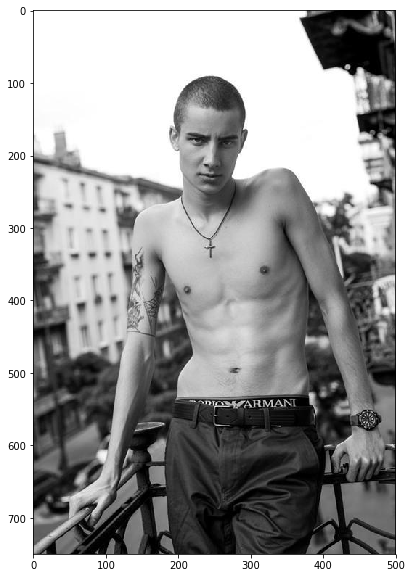

topwords of image  e957528e9ddc3be3a779879f6feb40d69951d5db.jpg
0 健身房 0.426227|1 街道 0.335536|2 拳击场 0.327039|3 艺术 0.299955|4 垃圾场 0.283512|5 篮球场 0.28033|6 阳台 0.275701|7 乡村 0.271046|8 沙滩 0.266351|9 舞 0.249592|10 地 0.244435|11 游泳池 0.236309|12 店 0.231507|13 篮球馆 0.226641|14 农场 0.222547|15 餐厅 0.221869|16 美容 0.218603|17 田径 0.213255|18 室内 0.213239|19 卧室 0.212123|20 修理店 0.20869|21 帷幕 0.208425|22 排球场 0.207542|23 流水线 0.204293|24 树林 0.203309|25 勾着 0.199844|26 场 0.197465|27 建筑工地 0.195558|28 电梯 0.195197|29 拥抱着 0.194263|30 公园 0.193943|31 旁上 0.185759|32 仗 0.18523|33 冰山 0.183822|34 人脸 0.18306|35 食堂 0.181288|36 选花 0.180914|37 衣架 0.178917|38 毛豆 0.178894|39 楼梯 0.178118|40 解 0.176673|41 鹅 0.175966|42 巴里 0.175829|43 汽车 0.174299|44 人侧 0.172304|45 拉船 0.172135|46 石碑 0.170053|47 装着 0.169783|48 所 0.169607|49 发布会 0.169525|50 九 0.167947|51 蜥蜴 0.167241|52 贴纸 0.16675|53 二十二号 0.165838|54 站 0.165328|55 围站 0.165195|56 球桌 0.164571|57 湖 0.164345|58 润 0.16385|59 面罩 0.163727|60 卫生纸 0.162778|61 修理 0.162136|62 破碎 0.161838|63 

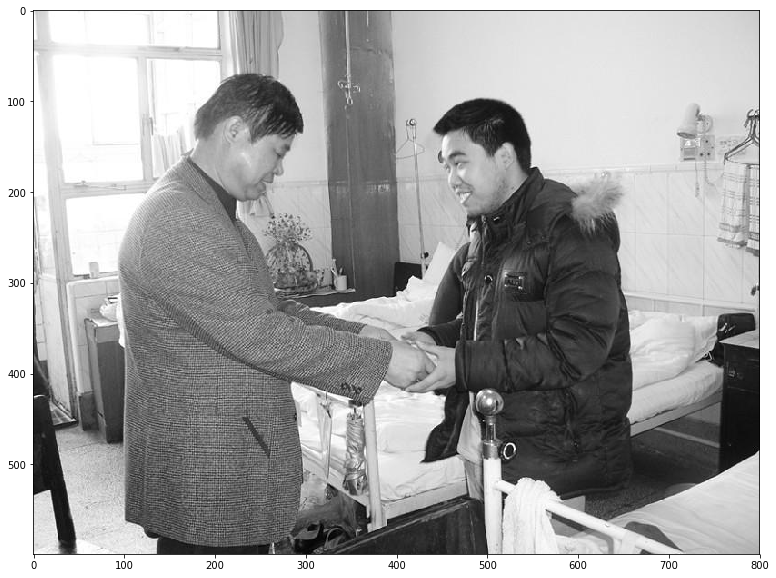

topwords of image  6e65197908d4514e038021e3b6b85d4e1f057545.jpg
0 航 0.445108|1 发 0.441628|2 阳台 0.38519|3 楼 0.370359|4 博物馆 0.366884|5 建筑工地 0.365727|6 美 0.361208|7 电梯 0.351811|8 美容 0.34197|9 咖啡厅 0.341265|10 店 0.332263|11 医院 0.325605|12 楼梯 0.314455|13 处 0.308522|14 办公室 0.307104|15 售票 0.298847|16 厨房 0.297315|17 室内 0.289141|18 站 0.283077|19 修理店 0.277922|20 酒吧 0.268582|21 演播室 0.268173|22 实验室 0.264241|23 站台 0.259621|24 教室 0.252796|25 电视 0.244936|26 艺术 0.244694|27 流水线 0.23884|28 餐厅 0.230092|29 展厅 0.23006|30 桥 0.224219|31 冰场 0.201588|32 图书馆 0.201082|33 金项链 0.197795|34 停机坪 0.196383|35 会议室 0.195993|36 机舱 0.191142|37 上编 0.18819|38 摸头 0.188095|39 玩耍 0.183081|40 面纱 0.181504|41 汽车 0.181443|42 小型 0.179632|43 街道 0.178864|44 二十二号 0.178776|45 卫衣 0.178225|46 严 0.178177|47 台 0.176507|48 一头 0.176499|49 音乐 0.175954|50 冰山 0.175932|51 擦鞋 0.174992|52 颁发奖杯 0.174709|53 卧室 0.172656|54 佳人 0.172558|55 消防 0.17205|56 盔甲 0.171622|57 签名版 0.171021|58 食堂 0.17093|59 竹子 0.170084|60 电影院 0.169615|61 雪 0.169333|62 录歌 0.169055|

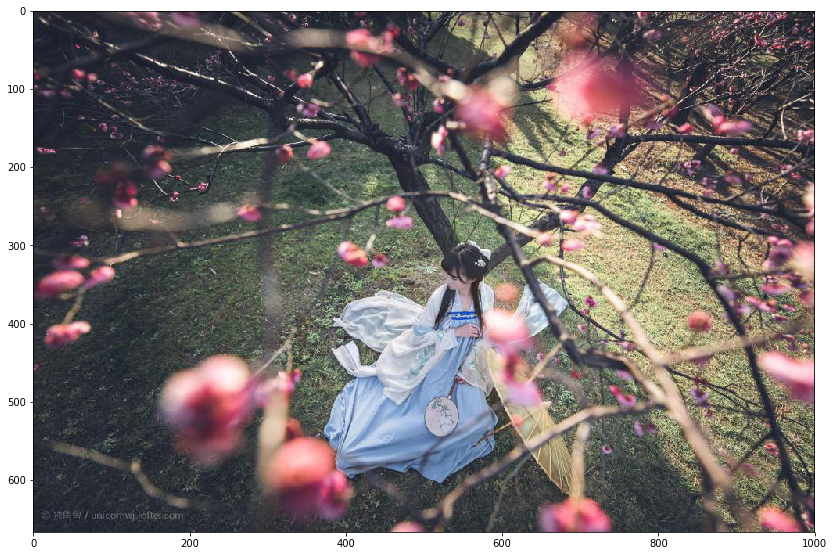

topwords of image  e3824e7044fd9fea3d21e1a1e98ecbd95e3cd85f.jpg
0 菜园 0.489183|1 果园 0.476322|2 树林 0.37912|3 花园 0.336311|4 湖 0.334599|5 温室 0.330612|6 垃圾场 0.31338|7 舞 0.312888|8 地 0.288515|9 农场 0.283567|10 渠 0.282687|11 田地 0.280636|12 室内 0.280078|13 河 0.277517|14 冰雕 0.264276|15 营 0.263135|16 厅 0.256667|17 沟 0.254682|18 冰山 0.235753|19 乡村 0.22992|20 山 0.22447|21 街道 0.223298|22 冰场 0.214138|23 舞台 0.21233|24 检查室 0.200728|25 篮球馆 0.197913|26 草地 0.192673|27 雪 0.191128|28 公园 0.190009|29 日 0.186982|30 篮球场 0.185268|31 斜靠 0.183363|32 乘客 0.183151|33 棒球场 0.178733|34 帐篷 0.176614|35 煲 0.175132|36 汤圆 0.1746|37 挎包 0.173764|38 冰天雪地 0.173608|39 脚站 0.173563|40 里试 0.173337|41 发放 0.172062|42 辘 0.17039|43 狐 0.169701|44 漂流 0.169451|45 很 0.169423|46 水族馆 0.169314|47 绿苔 0.16868|48 马喷 0.167926|49 花盆 0.167837|50 骑 0.166811|51 衣扣 0.166315|52 见 0.165406|53 古老 0.163881|54 超市 0.163455|55 长相 0.162019|56 凿 0.162015|57 额 0.161923|58 分析 0.161612|59 建筑工地 0.161347|60 池旁 0.161124|61 枚 0.161123|62 讲台 0.16083|63 人拉着 0.160713|64 椅 

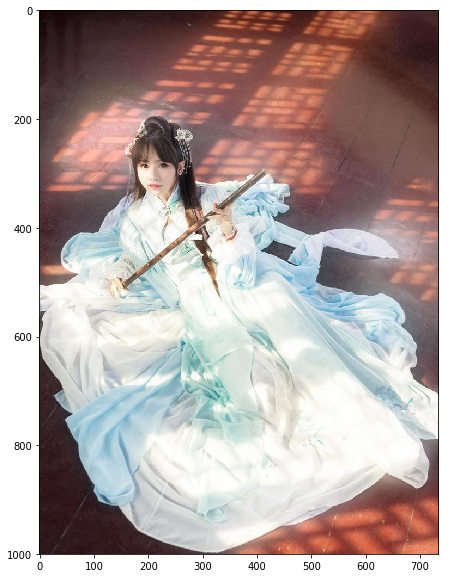

topwords of image  0aa9bd2851ea3cb45d99247ae9d9e7185036474c.jpg
0 冰山 0.426687|1 雪 0.420324|2 实验室 0.408688|3 厅 0.397943|4 食堂 0.367826|5 屋 0.365585|6 音乐 0.362795|7 舞 0.350254|8 台 0.340689|9 宴会 0.334402|10 舞台 0.333866|11 广场 0.315621|12 会议室 0.308063|13 美 0.30607|14 酒吧 0.301706|15 艺术 0.30087|16 冰雕 0.300092|17 医院 0.298798|18 咖啡厅 0.293998|19 电视 0.290495|20 餐厅 0.285171|21 发 0.273667|22 演播室 0.272835|23 流水线 0.267858|24 商店 0.264521|25 露 0.25845|26 博物馆 0.251773|27 店 0.249681|28 美容 0.240276|29 教堂 0.231504|30 工作室 0.228189|31 阳台 0.228004|32 室 0.227128|33 街道 0.226602|34 垃圾场 0.212699|35 厨房 0.211492|36 梳头发 0.205614|37 育 0.196519|38 奶茶 0.189154|39 机舱 0.186213|40 耕作 0.185608|41 儿 0.185499|42 室内 0.1854|43 雨棚 0.185361|44 集市 0.184489|45 展柜 0.184178|46 拓 0.182307|47 上侧 0.181598|48 消防 0.181207|49 满头白发 0.180314|50 塔 0.179112|51 办公室 0.178466|52 竖 0.177543|53 斯 0.177405|54 四目 0.175174|55 跑步机 0.174444|56 系鞋带 0.172223|57 漂流 0.171589|58 河 0.171395|59 上叠 0.169624|60 珠链 0.169246|61 斗笠 0.168812|62 案板 0.167699|63 展厅 0.1

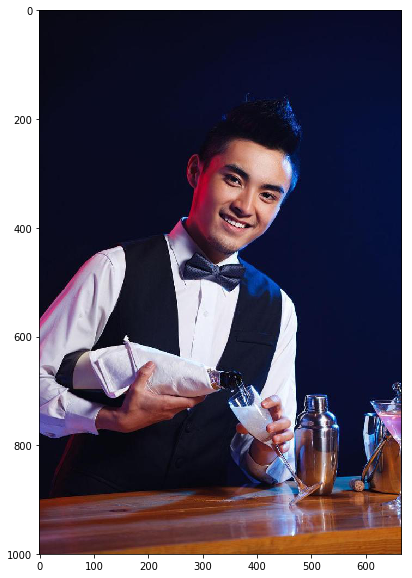

topwords of image  7faec9a7abd8c146b9b6a70e7340c7b8ff8dffc0.jpg
0 酒吧 0.480142|1 咖啡厅 0.455904|2 会议室 0.444735|3 舞台 0.436563|4 宴会 0.417132|5 演播室 0.396269|6 餐厅 0.393402|7 食堂 0.3846|8 电视 0.370995|9 办公室 0.369007|10 室 0.365818|11 台 0.362615|12 艺术 0.360002|13 实验室 0.355644|14 教室 0.332264|15 音乐 0.323528|16 厨房 0.316282|17 屋 0.30973|18 厅 0.308984|19 棋牌 0.277662|20 地 0.276858|21 发 0.27161|22 站 0.244665|23 工作室 0.241861|24 美 0.234141|25 博物馆 0.2322|26 广场 0.211375|27 塔 0.210357|28 人包 0.207896|29 划线 0.201271|30 垫子 0.196325|31 电风扇 0.193006|32 美容 0.190179|33 壁上 0.188099|34 舞 0.186579|35 印章 0.183649|36 湖 0.183532|37 茶具 0.183327|38 儿童座椅 0.183093|39 坑 0.182854|40 感 0.182384|41 抬手 0.181914|42 长矛 0.181458|43 皿 0.180981|44 绿叶 0.18022|45 电脑主机 0.179362|46 机舱 0.177527|47 电脑 0.173735|48 上篮 0.173583|49 运动装 0.172|50 店 0.170533|51 人端 0.170153|52 天气晴朗 0.170091|53 骑 0.169831|54 挑书 0.169276|55 冰糖葫芦 0.168359|56 剪头发 0.167633|57 攘 0.167341|58 放水 0.166312|59 室内 0.166239|60 长亭 0.166156|61 狭窄 0.16562|62 笔袋 0.165434|63 衣着 0.164

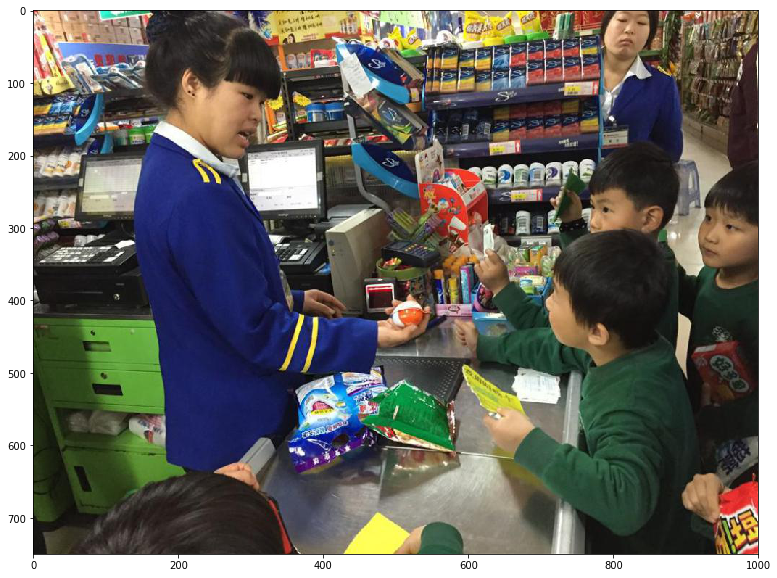

topwords of image  75662cb99f827c707eead7ee31bb354d592d669a.jpg
0 超市 0.546879|1 餐厅 0.531295|2 集市 0.487926|3 酒吧 0.48363|4 宴会 0.454263|5 食堂 0.404675|6 咖啡厅 0.40253|7 商店 0.398082|8 流水线 0.387887|9 发 0.372552|10 书店 0.364599|11 室 0.361581|12 会议室 0.358739|13 露 0.352049|14 修理店 0.331091|15 店 0.32772|16 图书馆 0.326903|17 厅 0.315825|18 艺术 0.308337|19 棋牌 0.304912|20 厨房 0.294469|21 美 0.289382|22 教室 0.28771|23 医院 0.270118|24 帐篷 0.256132|25 办公室 0.252958|26 美容 0.246942|27 楼 0.245956|28 处 0.24553|29 垃圾场 0.238573|30 实验室 0.238254|31 屋 0.236031|32 广场 0.23543|33 消防 0.225779|34 保龄球馆 0.197094|35 墙前 0.189181|36 加油站 0.188865|37 玻璃窗 0.188157|38 宇航员 0.183911|39 带旁 0.182923|40 街道 0.179759|41 织布机 0.179303|42 暖 0.179284|43 雪 0.178279|44 电视 0.172991|45 台 0.172714|46 博物馆 0.172237|47 两人前 0.169165|48 丹顶鹤 0.168605|49 看腿 0.168499|50 消防演习 0.168468|51 房屋内 0.168426|52 小 0.168131|53 打坐 0.167646|54 助行 0.16583|55 冰场 0.165527|56 雪花 0.164167|57 夺目 0.163861|58 工作室 0.163021|59 补鞋 0.162603|60 款式 0.162431|61 西瓜 0.161721|62 阄 0.161619|6

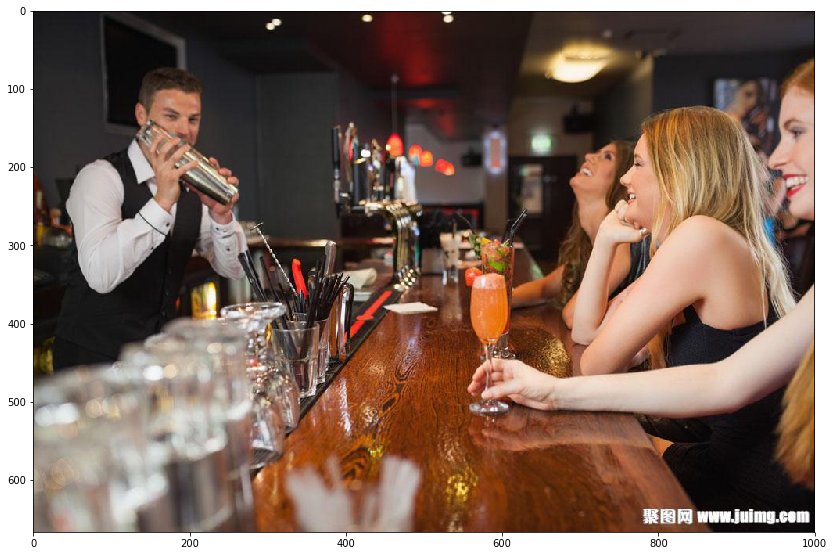

topwords of image  af2e95e839172a1bf25a92807fe49ac27f161b41.jpg
0 酒吧 0.604157|1 厅 0.566023|2 咖啡厅 0.548277|3 食堂 0.504358|4 宴会 0.477453|5 台 0.453035|6 餐厅 0.418885|7 发 0.402307|8 电视 0.401585|9 舞台 0.39362|10 音乐 0.388508|11 演播室 0.386642|12 博物馆 0.361947|13 商店 0.35865|14 工作室 0.34466|15 会议室 0.333256|16 厨房 0.318168|17 图书馆 0.314209|18 舞 0.313801|19 美 0.297315|20 室 0.286149|21 教室 0.275777|22 艺术 0.264335|23 超市 0.262838|24 广场 0.245544|25 保龄球馆 0.234092|26 棋牌 0.232153|27 店 0.221694|28 雪白 0.209156|29 楼 0.208612|30 健身房 0.205139|31 实验室 0.202928|32 办公室 0.198243|33 观赏 0.190484|34 电梯 0.188635|35 电风扇 0.186326|36 两人前 0.185495|37 航 0.185472|38 病服 0.184414|39 骑 0.184032|40 教堂 0.183578|41 移动 0.181263|42 摄影棚 0.179089|43 屋 0.177241|44 玉米 0.176647|45 幻 0.176325|46 集市 0.175957|47 点滴 0.174255|48 坑 0.173401|49 拳击场 0.173308|50 店门口 0.173169|51 篮色 0.172488|52 隔 0.170191|53 礴 0.16964|54 旁有 0.169605|55 右脚 0.169475|56 阳台 0.168261|57 呐喊 0.167491|58 瓜果 0.166711|59 摸 0.164727|60 衣袖 0.164418|61 挖土机 0.164142|62 骰 0.163965|63 滴眼

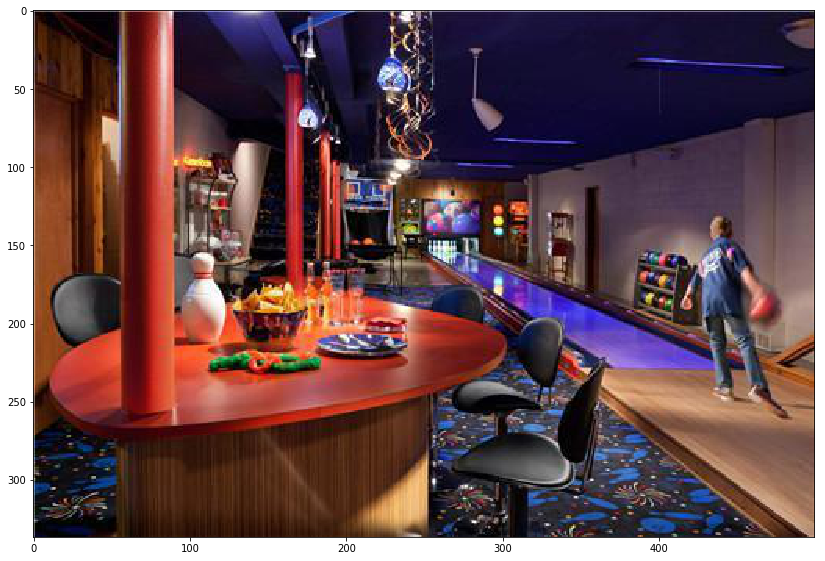

topwords of image  03b64c98066f0f46ece6ca7dab77f4f9ed0bce53.jpg
0 发 0.554561|1 宴会 0.535382|2 会议室 0.520539|3 厅 0.504865|4 咖啡厅 0.473659|5 酒吧 0.456095|6 商店 0.431327|7 食堂 0.425445|8 教室 0.409387|9 餐厅 0.408098|10 演播室 0.406398|11 美 0.384536|12 棋牌 0.363589|13 办公室 0.337492|14 图书馆 0.336422|15 店 0.316188|16 健身房 0.30732|17 博物馆 0.303646|18 保龄球馆 0.303566|19 室 0.298194|20 美容 0.27717|21 教堂 0.272344|22 台 0.270929|23 电视 0.267713|24 舞台 0.26024|25 音乐 0.25307|26 加油站 0.229014|27 实验室 0.220722|28 展厅 0.218144|29 集市 0.214117|30 拳击场 0.209122|31 消防 0.207805|32 工作室 0.204148|33 汽车 0.202046|34 阄 0.19749|35 街道 0.195525|36 超市 0.19462|37 室内 0.192483|38 厨房 0.191095|39 屋里 0.185201|40 囊 0.183701|41 幻 0.181533|42 器械 0.180906|43 广场 0.177056|44 模型 0.176943|45 韩 0.176119|46 适 0.172525|47 观赏 0.172327|48 空无一人 0.171848|49 岩石 0.171252|50 艺术 0.169889|51 电风扇 0.168579|52 感 0.168179|53 款式 0.16797|54 铁环 0.167666|55 助行 0.166385|56 旁有 0.164925|57 缝纫 0.16484|58 治病 0.164647|59 前自 0.163931|60 书店 0.163882|61 雨纷飞 0.162913|62 浅棕色 0.16262|63 手

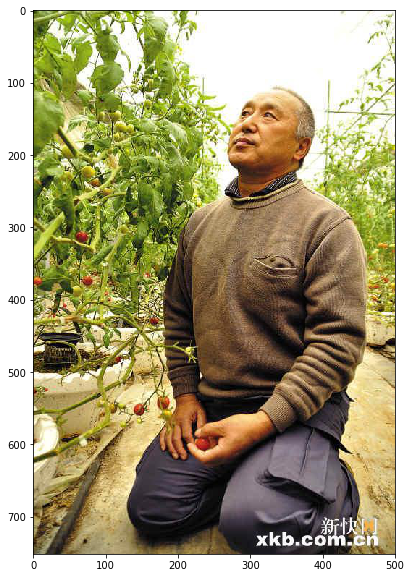

topwords of image  9a079d360792e2141dbdd9bf5057bc0d52eabebf.jpg
0 菜园 0.663145|1 果园 0.57843|2 温室 0.565534|3 树林 0.513558|4 花园 0.469522|5 农场 0.390291|6 田地 0.379261|7 乡村 0.375881|8 室内 0.358996|9 建筑工地 0.348819|10 沟 0.3465|11 营 0.344182|12 渠 0.338746|13 垃圾场 0.332317|14 山 0.33053|15 草地 0.327097|16 公园 0.305661|17 地 0.284896|18 牧 0.26561|19 阳台 0.253536|20 街道 0.239831|21 展厅 0.236169|22 湖 0.230973|23 演播室 0.227321|24 博物馆 0.218684|25 帐篷 0.212168|26 探讨问题 0.209992|27 柔道 0.20292|28 检查室 0.20122|29 沙漠 0.188603|30 场 0.186002|31 人侧 0.185607|32 恤 0.185381|33 河 0.181611|34 集市 0.181194|35 脚站 0.178947|36 花瓣 0.178232|37 修车 0.178038|38 贩 0.17587|39 植物 0.174917|40 绳梯 0.169283|41 髅 0.167709|42 掐 0.167024|43 捆着 0.166963|44 算术 0.166562|45 男女 0.165154|46 火炉 0.164872|47 把头 0.164843|48 蜂 0.164643|49 荐 0.16441|50 麦地 0.16413|51 女士 0.163846|52 光彩耀目 0.163221|53 深绿色 0.16314|54 排轮 0.163051|55 挎包 0.162451|56 电源 0.161451|57 练习场 0.161349|58 鱼塘 0.161336|59 学士 0.161305|60 手带 0.160676|61 浪涛 0.160056|62 绿苔 0.159844|63 前倾 0.159164|

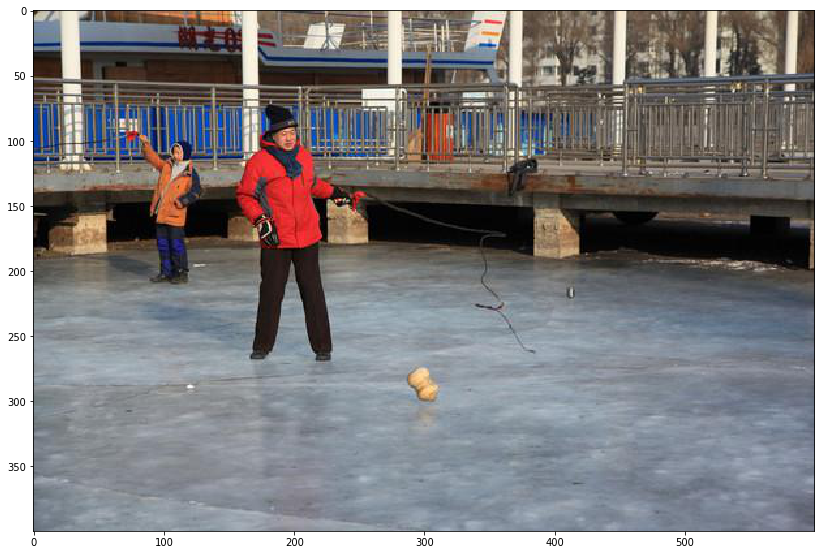

topwords of image  b1653482971b24d12a28b3e1eb93e974a4383fcb.jpg
0 河 0.485624|1 湖 0.454948|2 桥 0.436668|3 冰场 0.418091|4 游泳池 0.415857|5 亭子 0.387053|6 建筑工地 0.336238|7 拳击场 0.334283|8 航 0.325973|9 地 0.319076|10 田径 0.317405|11 沟 0.310124|12 排球场 0.309276|13 漂流 0.297995|14 站台 0.288591|15 水族馆 0.284445|16 广场 0.275891|17 舞 0.273452|18 流水线 0.253945|19 阳台 0.249831|20 电梯 0.241533|21 教堂 0.230045|22 冰雕 0.226693|23 塔 0.218811|24 健身房 0.210778|25 站 0.205227|26 楼梯 0.204657|27 游乐场 0.201256|28 寺庙 0.200713|29 室内 0.200351|30 保龄球馆 0.199901|31 屋 0.192612|32 街道 0.192448|33 攘 0.191596|34 托起 0.190758|35 演播室 0.189123|36 宫殿 0.187184|37 钉 0.186727|38 电视 0.184544|39 校车 0.184077|40 热水 0.177653|41 小卖部 0.176938|42 械 0.176717|43 防风 0.176163|44 公园 0.175826|45 骑着马 0.170959|46 相撞 0.170789|47 海浪 0.169762|48 整理 0.169469|49 农忙 0.169188|50 象 0.168478|51 讲故事 0.168471|52 花园 0.16802|53 斗牛场 0.167933|54 鸡笼 0.167912|55 展厅 0.167762|56 室 0.167555|57 上篮 0.167386|58 灯旁 0.167257|59 武士刀 0.167144|60 瓶子 0.167138|61 马甲 0.166989|62 侧卧 0.16698|6

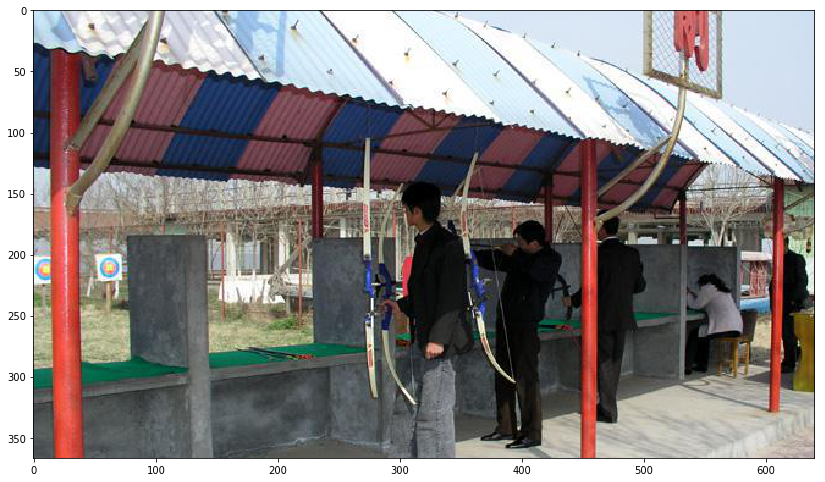

topwords of image  d60d78d5020ee14616a8532d59f849d553c24ac5.jpg
0 游乐场 0.532855|1 亭子 0.485789|2 公园 0.372475|3 乡村 0.337977|4 广场 0.312174|5 寺庙 0.310891|6 电梯 0.293143|7 游泳池 0.291798|8 站台 0.286093|9 儿 0.278326|10 街道 0.270435|11 博物馆 0.268197|12 建筑工地 0.266269|13 水族馆 0.263114|14 花园 0.262992|15 集市 0.260828|16 屋 0.247162|17 室内 0.245235|18 露 0.245024|19 实验室 0.230764|20 食堂 0.229171|21 楼梯 0.227476|22 冰雕 0.217932|23 超市 0.215112|24 树林 0.213722|25 上去 0.213236|26 阳台 0.210332|27 流水线 0.210173|28 营 0.20571|29 室 0.202802|30 镜子 0.201658|31 滑冰 0.201363|32 帐篷 0.19952|33 红丝 0.199012|34 餐厅 0.195933|35 桥 0.194788|36 楼 0.193042|37 棋牌 0.192252|38 咖啡厅 0.186885|39 电视 0.186656|40 前包 0.184748|41 厅 0.184572|42 拳击场 0.183606|43 自行车 0.18245|44 宫殿 0.181255|45 加油站 0.181077|46 旁自 0.18044|47 牧 0.180008|48 在场 0.178638|49 河 0.17835|50 舞台 0.178283|51 小红旗 0.177243|52 育 0.176505|53 铠甲 0.176327|54 演播室 0.175637|55 地 0.174307|56 冰山 0.171264|57 十三号 0.170172|58 一字 0.16973|59 场 0.168892|60 凹凸 0.167686|61 摆桌 0.167471|62 打斯 0.167318|63 售票

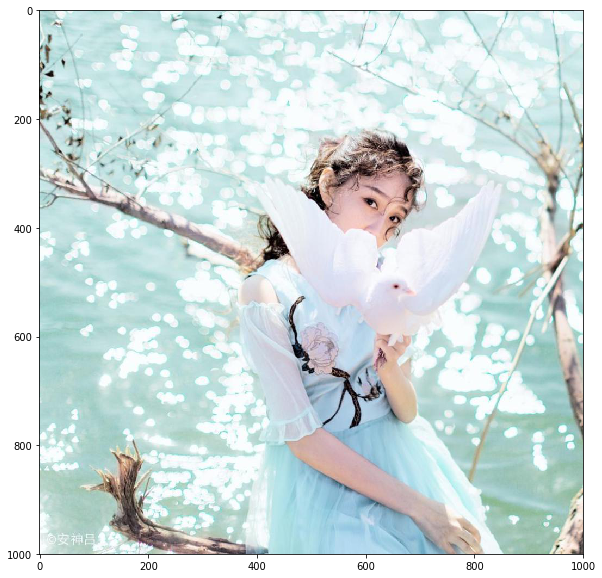

topwords of image  7fb83ef0125c461ad31521307bb7594bdad30af7.jpg
0 雪 0.520421|1 冰雕 0.506806|2 冰山 0.506016|3 游泳池 0.447836|4 沙滩 0.428081|5 湖 0.423845|6 河 0.388471|7 滑雪场 0.385869|8 屋 0.345418|9 水族馆 0.336781|10 舞 0.334866|11 地 0.324217|12 儿 0.317333|13 冰场 0.31641|14 农场 0.286431|15 阳台 0.279235|16 温室 0.277935|17 舞台 0.277062|18 田地 0.2738|19 亭子 0.270569|20 花园 0.269839|21 卧室 0.269439|22 育 0.269314|23 草地 0.255392|24 桥 0.250455|25 山 0.250379|26 沙漠 0.247541|27 菜园 0.24388|28 营 0.234361|29 树林 0.229853|30 漂流 0.224383|31 帐篷 0.215494|32 公园 0.210222|33 露 0.209434|34 卖场 0.203437|35 沟 0.202633|36 排轮 0.190873|37 防护栏 0.190535|38 敲 0.186974|39 阶 0.182522|40 拳击场 0.182515|41 电视 0.182275|42 厅 0.181651|43 后空翻 0.179611|44 范 0.179414|45 繁茂 0.178148|46 室内 0.177159|47 的 0.176161|48 会 0.175393|49 盆花 0.174607|50 街边 0.17289|51 窗口 0.171541|52 烤鸭 0.170983|53 广场 0.170547|54 泡澡 0.170252|55 址 0.16986|56 平板车 0.169662|57 运动衣 0.169024|58 后视镜 0.168939|59 说话 0.168308|60 膝 0.16682|61 柔道 0.166317|62 招 0.16603|63 楼梯 0.165785|64 泥鳅 0

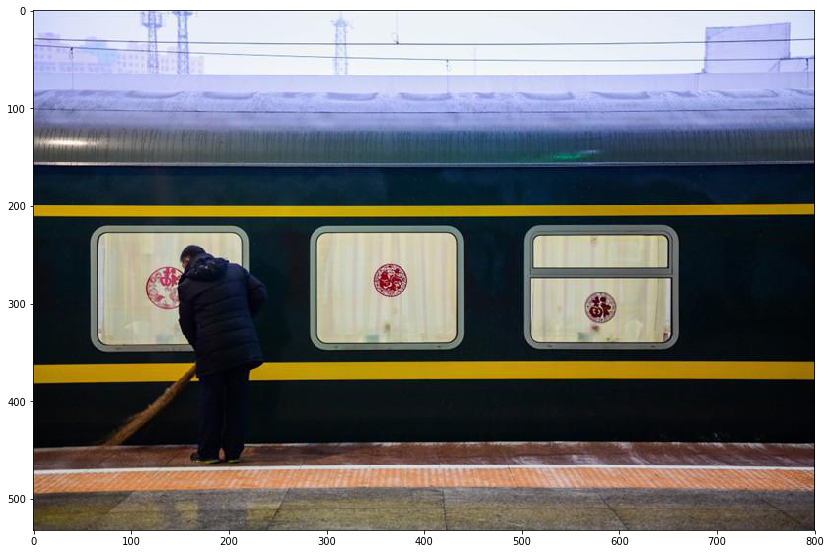

topwords of image  ba825d042cba509d615448ba5ff060a7341246d5.jpg
0 站台 0.631493|1 航 0.393486|2 处 0.391556|3 电梯 0.355466|4 楼 0.31826|5 楼梯 0.314191|6 保龄球馆 0.296198|7 发 0.292295|8 博物馆 0.27174|9 售票 0.262458|10 加油站 0.244813|11 机舱 0.240034|12 建筑工地 0.239843|13 展厅 0.236231|14 店 0.226455|15 汽车 0.214987|16 商店 0.206036|17 站 0.20511|18 流水线 0.199912|19 艺术 0.195592|20 美容 0.19471|21 消防 0.194682|22 美 0.192469|23 咖啡厅 0.174591|24 鱿鱼 0.173412|25 修理店 0.171986|26 检测 0.171628|27 人后 0.169494|28 卖萌 0.16891|29 水族馆 0.168623|30 李 0.168118|31 握手 0.167294|32 台 0.167001|33 医院 0.165863|34 菌菇 0.16561|35 镜子 0.165106|36 颁发奖杯 0.164442|37 金项链 0.16408|38 包扎着 0.163638|39 滑车 0.16329|40 竖 0.162904|41 阳台 0.162081|42 双人舞 0.161066|43 雾气 0.160979|44 饭桌 0.160609|45 校 0.159719|46 驾 0.159533|47 奶牛 0.159413|48 演播室 0.159288|49 标本 0.159278|50 虎 0.159015|51 剪羊毛 0.15899|52 琴键 0.158866|53 棋牌 0.158798|54 海带 0.158536|55 泳 0.158179|56 瓷器 0.158099|57 殖 0.157949|58 立式 0.157873|59 冻 0.157837|60 高个子 0.15762|61 太空舱 0.156679|62 礼品 0.156527|63 许 0.1

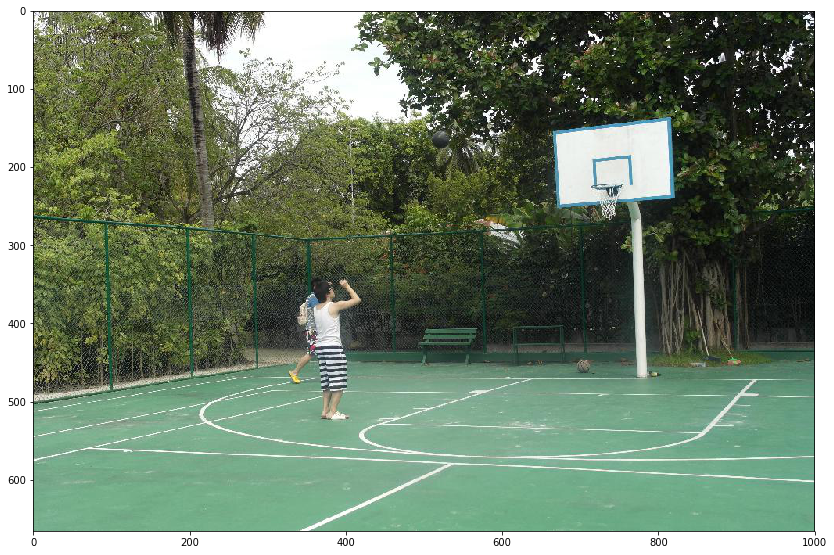

topwords of image  a0e34cef392590fb0fd9a13027cf37d52c12b4d4.jpg
0 田径 0.652028|1 排球场 0.488789|2 棒球场 0.422915|3 篮球场 0.383551|4 地 0.375602|5 场 0.370763|6 树林 0.338982|7 篮球馆 0.33339|8 橄榄球场 0.330354|9 足球场 0.316032|10 桥 0.292664|11 高尔夫球场 0.2776|12 广场 0.265479|13 冰场 0.264163|14 花园 0.255681|15 拳击场 0.248861|16 草地 0.247019|17 营 0.234219|18 建筑工地 0.232355|19 舞 0.229405|20 室内 0.226446|21 湖 0.223486|22 游泳池 0.207013|23 农场 0.205312|24 实验室 0.201227|25 棋牌 0.200883|26 渠 0.196159|27 柔道 0.194614|28 公园 0.194049|29 沟 0.193467|30 框前 0.192517|31 河 0.191278|32 保龄球馆 0.189055|33 瀚 0.188453|34 投币 0.188283|35 十号 0.185177|36 没有 0.185075|37 柴 0.184423|38 里试 0.180679|39 16 0.180347|40 整理 0.178463|41 钉子 0.177181|42 土黄色 0.176913|43 豚 0.174085|44 扭 0.172909|45 卷子 0.172765|46 种花 0.172702|47 音乐 0.172319|48 龟裂 0.171782|49 冲浪板 0.170131|50 献血车 0.167909|51 双截棍 0.167109|52 往 0.165994|53 换 0.165679|54 芒 0.165643|55 巨石 0.165|56 木棍 0.163785|57 答 0.163509|58 头套 0.163317|59 沿上 0.162068|60 拨浪鼓 0.162015|61 饭碗 0.161822|62 仙人球 0.161619|6

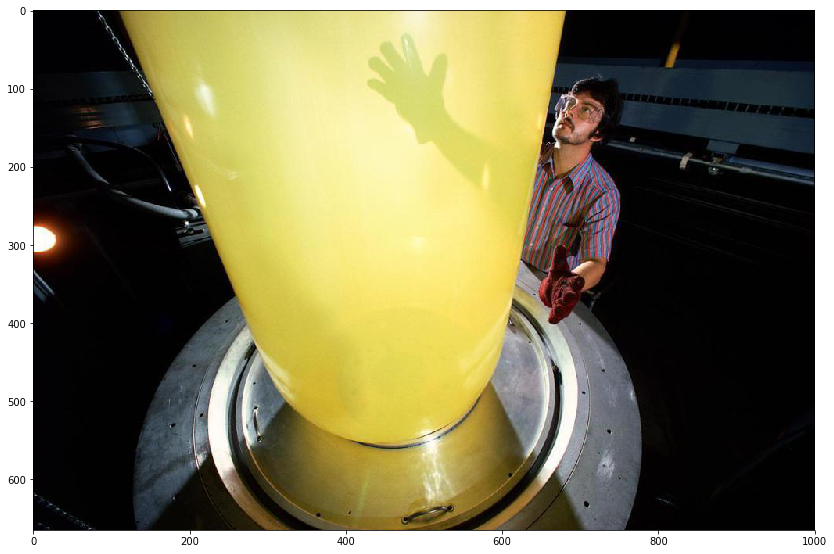

topwords of image  9b06349d0bc13f3e5acae1f0dadaafcf14fdbe7b.jpg
0 展厅 0.500862|1 汽车 0.484961|2 街道 0.430154|3 加油站 0.368695|4 修理店 0.329654|5 流水线 0.328284|6 建筑工地 0.29986|7 游乐场 0.273291|8 广场 0.271185|9 食堂 0.259178|10 电梯 0.25644|11 站台 0.254527|12 店 0.23875|13 拳击场 0.235953|14 保龄球馆 0.233897|15 游泳池 0.230852|16 博物馆 0.229151|17 阳台 0.226065|18 美 0.221512|19 台 0.217922|20 楼梯 0.216183|21 电视机 0.215352|22 公园 0.213577|23 航 0.211213|24 健身房 0.207001|25 厨房 0.206498|26 发 0.206471|27 看着 0.204564|28 机舱 0.201|29 实验室 0.197432|30 停机坪 0.197076|31 桥 0.190926|32 餐厅 0.190104|33 咖啡厅 0.188637|34 迷彩服 0.187851|35 工作室 0.186632|36 桌边 0.184809|37 果林 0.182739|38 购物 0.182132|39 处 0.180984|40 面条 0.180622|41 投影 0.180609|42 袈 0.178396|43 馒 0.17808|44 水族馆 0.177744|45 建 0.17708|46 田径 0.176002|47 站 0.175292|48 舞 0.174849|49 消防 0.174421|50 圈里 0.174124|51 缭 0.171872|52 泡 0.169542|53 演播室 0.169405|54 传单 0.169173|55 美容 0.167709|56 湍 0.166905|57 楼 0.166411|58 森林 0.165852|59 雪糕 0.165574|60 盖子 0.165449|61 水田 0.165392|62 浓烟滚滚 0.165115|63 

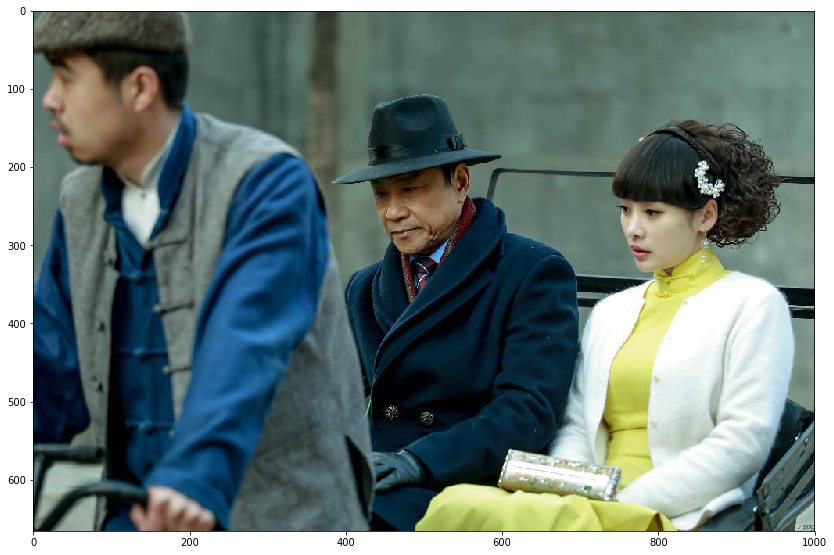

topwords of image  cd945e5ded9e801f1cb94010579a5ef1775e4f8f.jpg
0 乡村 0.426248|1 室内 0.383235|2 餐厅 0.351819|3 公园 0.314701|4 高尔夫球场 0.313887|5 厨房 0.30938|6 田径 0.306174|7 咖啡厅 0.301432|8 花园 0.293405|9 草地 0.285147|10 艺术 0.284162|11 修理店 0.282657|12 集市 0.281842|13 场 0.277339|14 棒球场 0.272214|15 足球场 0.27152|16 跑马场 0.267945|17 树林 0.262155|18 街道 0.261986|19 流水线 0.260235|20 停机坪 0.255128|21 楼 0.251568|22 演播室 0.239985|23 美 0.23811|24 广场 0.234987|25 牧 0.225799|26 室 0.225225|27 发 0.223704|28 酒吧 0.2189|29 展厅 0.217308|30 商店 0.216778|31 实验室 0.215356|32 斗牛场 0.215283|33 食堂 0.213013|34 医院 0.212759|35 书店 0.211652|36 阳台 0.211259|37 菜园 0.208641|38 营 0.207378|39 馅 0.205985|40 田地 0.204864|41 店 0.202271|42 塔 0.199169|43 露 0.198723|44 建筑工地 0.198542|45 帐篷 0.191228|46 温室 0.189492|47 玻 0.186215|48 办公室 0.185626|49 揭开 0.184532|50 你 0.183091|51 农场 0.179694|52 棋牌 0.179183|53 教室 0.17816|54 梳 0.177741|55 无几 0.175665|56 电视 0.174624|57 驾驶舱 0.173293|58 斓 0.172039|59 压 0.170559|60 生产 0.170438|61 戟 0.168683|62 会议室 0.168139|63 艳 0

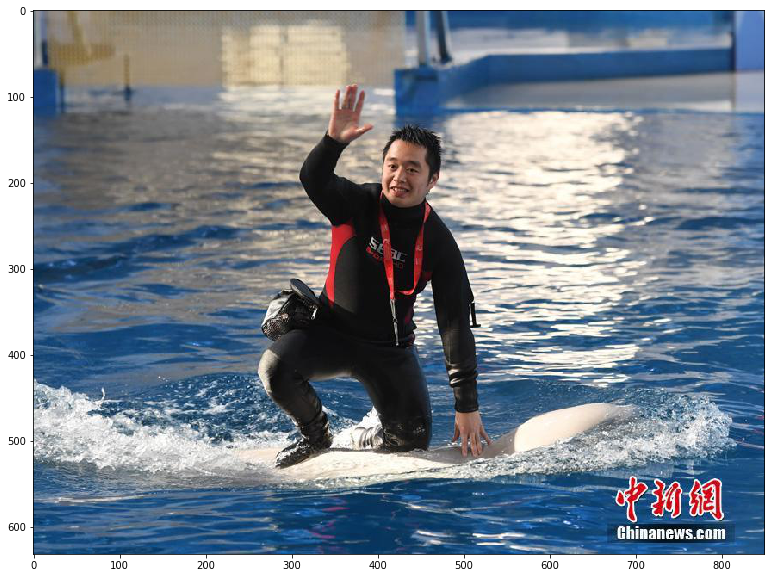

topwords of image  2d63f72be32980b2e4b00202c92b1859579a221a.jpg
0 游泳池 0.639358|1 湖 0.451311|2 沙滩 0.427763|3 水族馆 0.425957|4 河 0.396855|5 漂流 0.37069|6 冰场 0.370666|7 站 0.364386|8 拳击场 0.363232|9 航 0.345186|10 冰雕 0.342565|11 桥 0.332622|12 广场 0.315777|13 田径 0.290252|14 游乐场 0.281813|15 舞 0.263753|16 街道 0.261603|17 雪 0.242648|18 舞台 0.240963|19 建筑工地 0.229506|20 地 0.229123|21 宫殿 0.225157|22 塔 0.214173|23 楼 0.210711|24 排球场 0.210659|25 健身房 0.205365|26 拍 0.20069|27 花园 0.197839|28 流水线 0.196239|29 亭子 0.195524|30 冰山 0.195138|31 电梯 0.194804|32 道理 0.194192|33 托起 0.193981|34 阳台 0.187307|35 台 0.186661|36 屋 0.186323|37 厅 0.18481|38 语 0.183301|39 袈 0.178543|40 楼梯 0.176453|41 横幅 0.175588|42 一台 0.17355|43 古老 0.173285|44 电影院 0.172901|45 赤裸 0.1728|46 骑着马 0.172652|47 摊子 0.17228|48 冲浪板 0.171493|49 围站 0.170074|50 小鹿 0.170003|51 讲故事 0.168145|52 瑰 0.165586|53 营 0.165091|54 献花 0.164509|55 剥着 0.161607|56 履带 0.160392|57 洋 0.160323|58 篮球场 0.158642|59 诊所 0.15844|60 停机坪 0.157591|61 烤鸭 0.157288|62 藓 0.157241|63 球门 0.156828

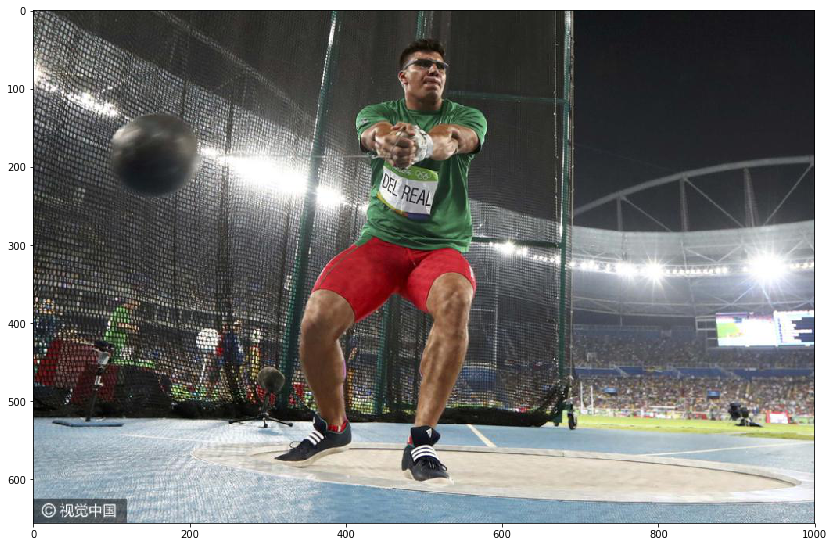

topwords of image  0d5bb5c1fcebec433bdd5a636c85e907d0d40535.jpg
0 田径 0.672214|1 拳击场 0.599075|2 篮球场 0.471164|3 篮球馆 0.443359|4 健身房 0.424475|5 广场 0.401091|6 公园 0.362744|7 棒球场 0.362308|8 舞台 0.348562|9 排球场 0.339864|10 舞 0.335112|11 场 0.333625|12 冰场 0.321932|13 保龄球馆 0.32125|14 站 0.301064|15 橄榄球场 0.285044|16 高尔夫球场 0.275631|17 店 0.274352|18 艺术 0.262776|19 美容 0.260924|20 停机坪 0.260403|21 发 0.257818|22 实验室 0.253609|23 台 0.245155|24 足球场 0.24115|25 航 0.23014|26 建筑工地 0.22276|27 楼 0.210108|28 厅 0.205876|29 街道 0.204086|30 液 0.203955|31 桥 0.201109|32 泼 0.189817|33 戴面具 0.187338|34 球鞋 0.186127|35 室 0.185701|36 冲浪板 0.184366|37 包靠 0.182248|38 人用 0.180241|39 房前 0.17599|40 木棍 0.174028|41 适 0.173587|42 合影 0.173507|43 河中 0.170205|44 玻璃窗 0.169676|45 博物馆 0.169643|46 旁倒 0.169493|47 电视 0.16726|48 黑衣 0.166154|49 人脸 0.165705|50 祭祀 0.165545|51 哥 0.165397|52 并排 0.164927|53 格子 0.164873|54 扭 0.164102|55 超 0.162851|56 募捐箱 0.162752|57 电梯 0.162528|58 本书 0.162484|59 食物 0.162043|60 皱 0.161675|61 堆 0.160668|62 美 0.160269|63 饭

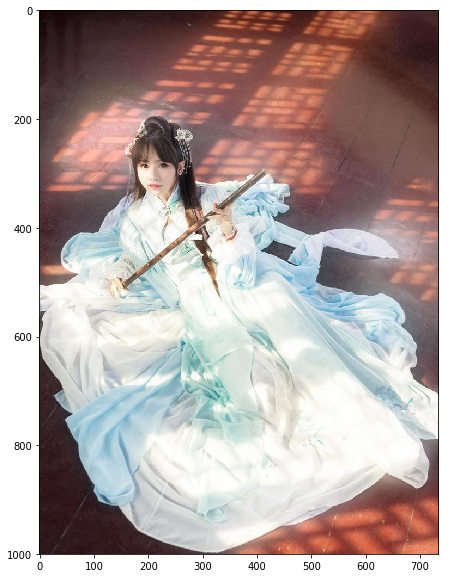

topwords of image  0aa9bd2851ea3cb45d99247ae9d9e7185036474c.jpg
0 冰山 0.426687|1 雪 0.420324|2 实验室 0.408688|3 厅 0.397943|4 食堂 0.367826|5 屋 0.365585|6 音乐 0.362795|7 舞 0.350254|8 台 0.340689|9 宴会 0.334402|10 舞台 0.333866|11 广场 0.315621|12 会议室 0.308063|13 美 0.30607|14 酒吧 0.301706|15 艺术 0.30087|16 冰雕 0.300092|17 医院 0.298798|18 咖啡厅 0.293998|19 电视 0.290495|20 餐厅 0.285171|21 发 0.273667|22 演播室 0.272835|23 流水线 0.267858|24 商店 0.264521|25 露 0.25845|26 博物馆 0.251773|27 店 0.249681|28 美容 0.240276|29 教堂 0.231504|30 工作室 0.228189|31 阳台 0.228004|32 室 0.227128|33 街道 0.226602|34 垃圾场 0.212699|35 厨房 0.211492|36 梳头发 0.205614|37 育 0.196519|38 奶茶 0.189154|39 机舱 0.186213|40 耕作 0.185608|41 儿 0.185499|42 室内 0.1854|43 雨棚 0.185361|44 集市 0.184489|45 展柜 0.184178|46 拓 0.182307|47 上侧 0.181598|48 消防 0.181207|49 满头白发 0.180314|50 塔 0.179112|51 办公室 0.178466|52 竖 0.177543|53 斯 0.177405|54 四目 0.175174|55 跑步机 0.174444|56 系鞋带 0.172223|57 漂流 0.171589|58 河 0.171395|59 上叠 0.169624|60 珠链 0.169246|61 斗笠 0.168812|62 案板 0.167699|63 展厅 0.1

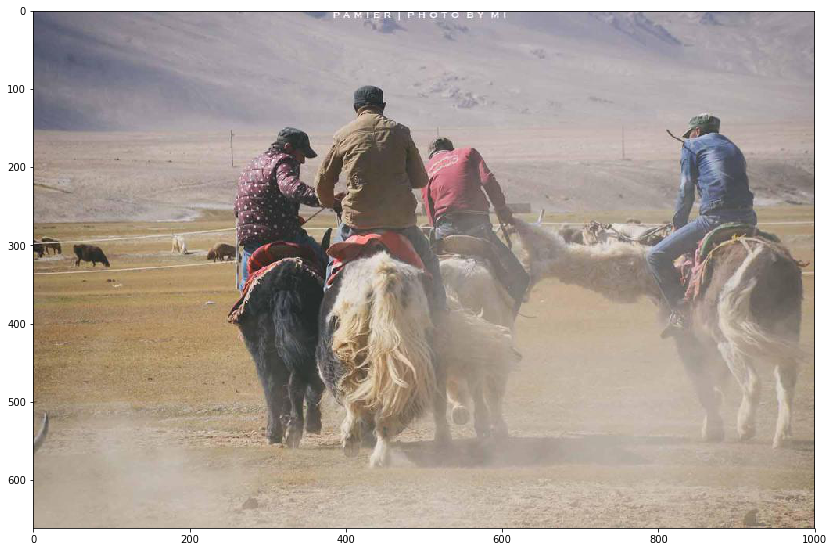

topwords of image  e2aa815c9f9dda30f50716ef9b15629322161ae1.jpg
0 牧 0.643781|1 沙漠 0.501386|2 场 0.450736|3 营 0.4484|4 跑马场 0.442076|5 斗牛场 0.437971|6 地 0.420596|7 帐篷 0.407829|8 渠 0.387898|9 山 0.378713|10 露 0.370559|11 乡村 0.348821|12 垃圾场 0.338675|13 田地 0.329383|14 冰雕 0.300459|15 农场 0.29662|16 滑雪场 0.272724|17 沙滩 0.263302|18 花园 0.25765|19 冰山 0.247628|20 雪 0.234114|21 沟 0.206887|22 集市 0.201428|23 停机坪 0.198213|24 冰场 0.198124|25 春意盎然 0.194395|26 目 0.193553|27 树林 0.192908|28 昂 0.190146|29 建筑工地 0.189481|30 广场 0.187143|31 草地 0.185536|32 酱料 0.178115|33 河 0.177078|34 倾斜 0.17621|35 稻草 0.17537|36 鞋盒 0.171374|37 解剖 0.169226|38 稻子 0.167708|39 温室 0.167675|40 平躺在 0.16754|41 豇豆 0.167533|42 博物馆 0.166709|43 湍急 0.165674|44 下摘 0.165498|45 植物 0.165471|46 大山 0.165464|47 卦 0.164452|48 淋 0.164282|49 春联 0.164118|50 安全 0.163545|51 敲打 0.163375|52 小男孩 0.163324|53 玻璃瓶 0.161315|54 托着 0.161268|55 河岸 0.161071|56 枯枝 0.161033|57 箭 0.160993|58 海报 0.160315|59 骆驼 0.158891|60 选择 0.158267|61 铜钱 0.157911|62 此 0.157036|63 浸 0.1568

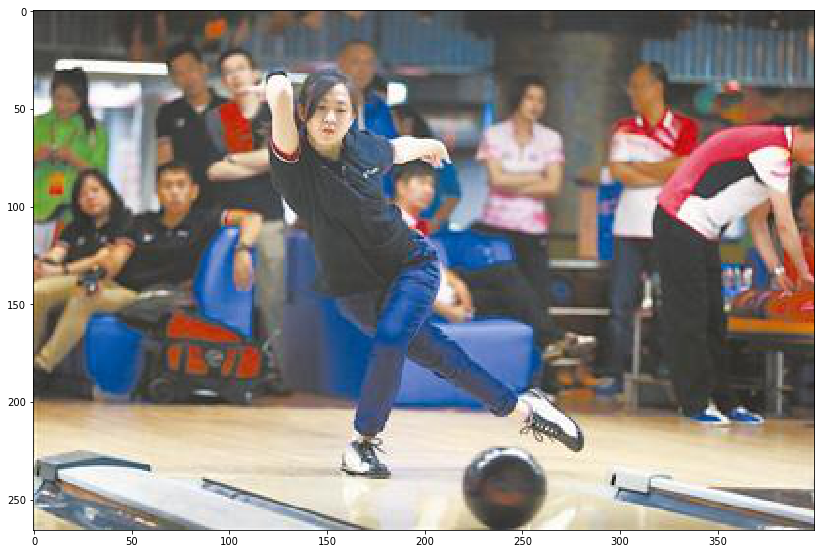

topwords of image  ac4acd52eaefb4e9324211ac58aad1d97f4bef8e.jpg
0 田径 0.565679|1 拳击场 0.55202|2 保龄球馆 0.497894|3 篮球馆 0.460448|4 健身房 0.452657|5 排球场 0.420115|6 篮球场 0.414481|7 航 0.406312|8 楼 0.389147|9 站台 0.381665|10 站 0.379169|11 冰场 0.335259|12 足球场 0.334696|13 台 0.302867|14 街道 0.302195|15 处 0.284326|16 橄榄球场 0.267766|17 舞 0.26592|18 棋牌 0.237466|19 停机坪 0.231665|20 发 0.215963|21 汽车 0.211698|22 售票 0.210437|23 广场 0.206564|24 食堂 0.193025|25 志愿者 0.189562|26 加油站 0.188473|27 舞台 0.186393|28 人脸 0.185937|29 水族馆 0.184759|30 粮 0.183004|31 果林 0.18268|32 厅 0.178723|33 欠 0.178191|34 阳光明媚 0.177434|35 骡子 0.17703|36 录音室 0.176621|37 流水线 0.175905|38 左边 0.175463|39 展厅 0.175378|40 教室 0.17439|41 压 0.173775|42 髻 0.173319|43 绿草如茵 0.173281|44 格子 0.173087|45 游乐场 0.17247|46 显示器 0.171594|47 博物馆 0.171366|48 适 0.170987|49 秤 0.169128|50 靓 0.168022|51 水塘 0.16761|52 悬在空中 0.167503|53 下楼梯 0.167391|54 公园 0.167351|55 上拾 0.167133|56 轻吻 0.167013|57 贴着 0.166079|58 形色 0.165144|59 裤脚 0.16508|60 天空 0.164828|61 修理店 0.163673|62 整理 0.1636

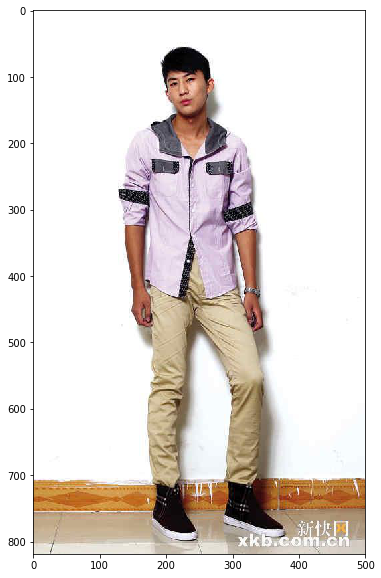

topwords of image  3dd309ca864a969381ad0316e3e21d58007974e3.jpg
0 舞台 0.383711|1 办公室 0.311142|2 街道 0.266368|3 阳台 0.257421|4 舞 0.253876|5 冰场 0.247476|6 高尔夫球场 0.241851|7 电视 0.240586|8 楼梯 0.237329|9 台 0.230477|10 桥 0.229204|11 演播室 0.220342|12 电梯 0.219957|13 楼 0.213598|14 室内 0.20876|15 音乐 0.205914|16 沟 0.202341|17 粗 0.201056|18 沙漠 0.197492|19 挖掘机 0.193951|20 黄鳝 0.192456|21 草地 0.191584|22 乡村 0.190195|23 站 0.186777|24 沙滩 0.185584|25 渠 0.183199|26 蒙古 0.182956|27 取款机 0.181771|28 地 0.178949|29 滴眼药 0.178408|30 吹气 0.176848|31 橘红色 0.176268|32 招 0.174417|33 柔道 0.173757|34 走 0.173407|35 开会 0.173129|36 一人前 0.172881|37 农场 0.172846|38 营 0.172457|39 万人 0.172433|40 道路 0.17181|41 水箱 0.17161|42 递鞋 0.17121|43 答 0.169705|44 树林 0.168747|45 小号 0.167924|46 卧室 0.16775|47 跑马场 0.167195|48 旅馆 0.16634|49 相似 0.165969|50 网球拍 0.165843|51 啊 0.163941|52 碰 0.163375|53 蜷缩 0.163202|54 阔腿裤 0.163011|55 烹饪 0.162814|56 翩 0.162734|57 四只 0.162444|58 捞鱼 0.162038|59 陈 0.161472|60 上 0.161429|61 炎 0.160811|62 捉鱼 0.160785|63 绶带 0.16071

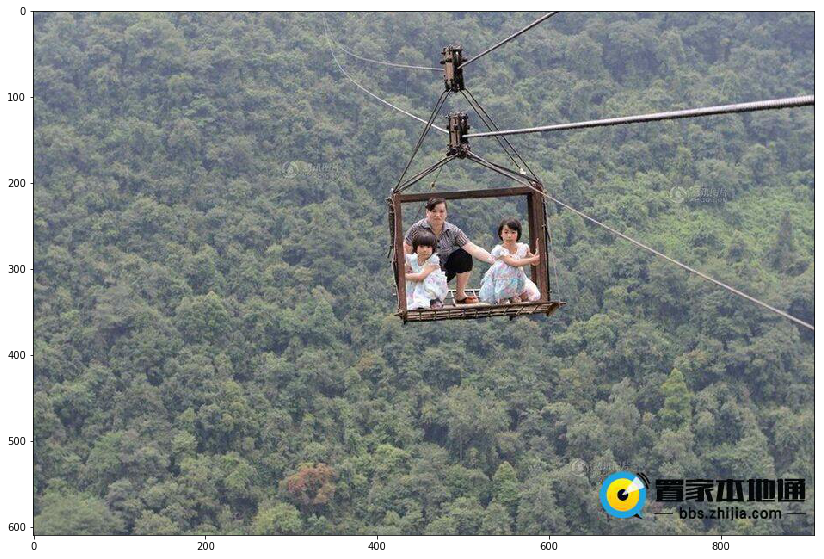

topwords of image  4c0327094e022f21402de8c3ba97a0f2bdd6a95f.jpg
0 田径 0.468614|1 游乐场 0.435322|2 排球场 0.415473|3 花园 0.382503|4 桥 0.373538|5 塔 0.370004|6 建筑工地 0.346483|7 乡村 0.334537|8 山 0.310371|9 广场 0.304986|10 阳台 0.29588|11 教堂 0.293013|12 河 0.281868|13 渠 0.273059|14 农场 0.272692|15 田地 0.257781|16 菜园 0.247958|17 地 0.247155|18 亭子 0.240642|19 停机坪 0.238349|20 草地 0.234444|21 树林 0.232786|22 营 0.224488|23 果园 0.221748|24 冰山 0.214906|25 篮球场 0.21476|26 场 0.214497|27 宫殿 0.211577|28 寺庙 0.211524|29 跑马场 0.210021|30 唱歌 0.207736|31 室内 0.200123|32 床铺 0.196246|33 温室 0.195201|34 流水线 0.194053|35 街道 0.191996|36 鼠标 0.191026|37 湖 0.186096|38 苏 0.184036|39 花朵 0.183773|40 牧 0.182454|41 沟 0.182257|42 白马 0.180511|43 大熊猫 0.179712|44 答 0.178684|45 看同 0.178565|46 店员 0.175633|47 外看 0.174676|48 花袋 0.172461|49 丰满 0.172134|50 屋 0.172037|51 <S> 0.171543|52 盲人 0.171182|53 公园 0.170576|54 篮球馆 0.170116|55 斑驳 0.169629|56 切菜 0.169099|57 签字 0.16847|58 舞 0.168461|59 背篓 0.166865|60 棒球场 0.166858|61 垃圾场 0.166515|62 集市 0.166083|63 架子 

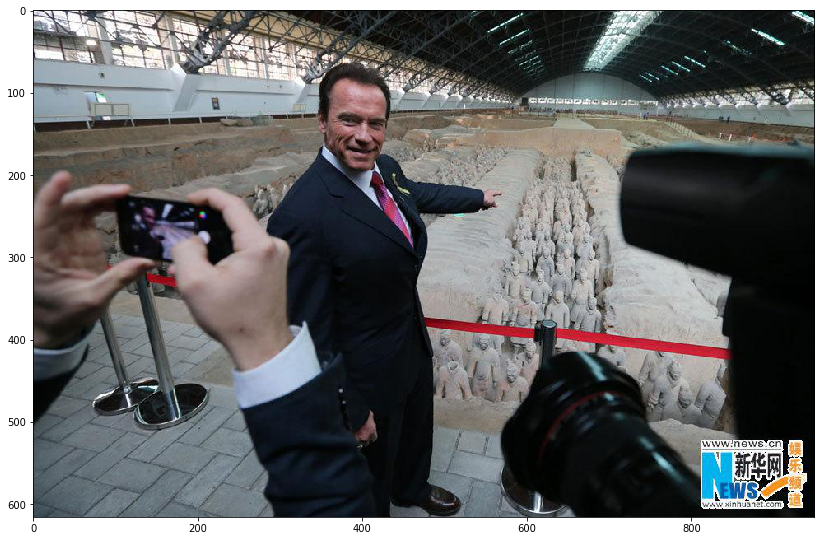

topwords of image  b79a0da2d450ce4d1841a97803a4489f4d9dd09a.jpg
0 航 0.519379|1 修理店 0.393555|2 站 0.370405|3 台 0.367713|4 停机坪 0.367557|5 消防 0.361504|6 演播室 0.359818|7 电梯 0.341475|8 流水线 0.338693|9 博物馆 0.310073|10 楼梯 0.308875|11 机舱 0.298579|12 田径 0.295839|13 建筑工地 0.292628|14 桥 0.289068|15 加油站 0.282624|16 山 0.280546|17 电视 0.262717|18 温室 0.261127|19 舞台 0.255667|20 冰山 0.252646|21 公园 0.251265|22 音乐 0.250999|23 实验室 0.247141|24 楼 0.241083|25 街道 0.239432|26 广场 0.237872|27 保龄球馆 0.23584|28 屋 0.230025|29 工作室 0.221405|30 塔 0.219383|31 游乐场 0.217209|32 沟 0.214176|33 宫殿 0.210256|34 舞 0.205713|35 飘 0.20438|36 柔道 0.204224|37 阳台 0.201149|38 发 0.199182|39 拳击场 0.198638|40 店 0.195725|41 镜子 0.195447|42 水族馆 0.194593|43 踏 0.194541|44 冰场 0.194012|45 冰雕 0.193644|46 站台 0.193584|47 游泳池 0.192762|48 乡村 0.188402|49 拉面 0.18699|50 盘膝 0.186738|51 襟 0.186654|52 果林 0.186374|53 厅 0.185019|54 褂 0.184257|55 办公室 0.184178|56 喝粥 0.183361|57 车库里 0.182763|58 十八号 0.182417|59 艺术 0.180219|60 厚 0.17974|61 银色 0.178882|62 插进 0.178801|63 病

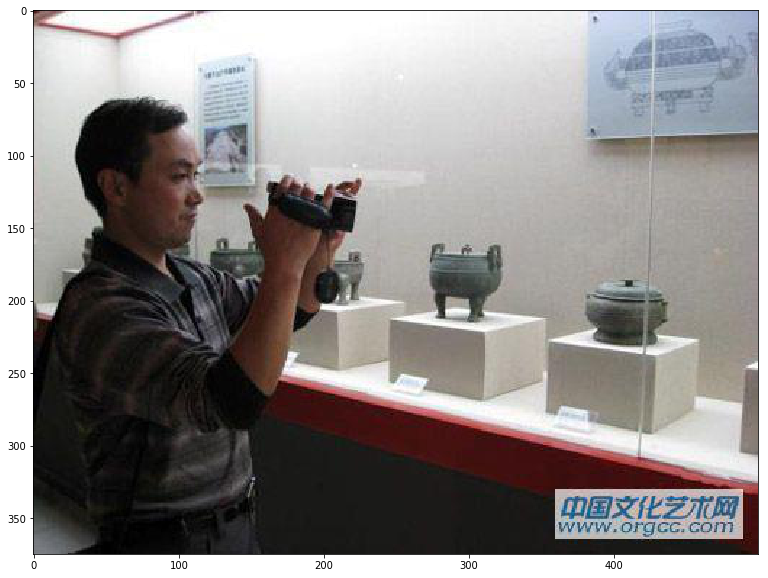

topwords of image  9fce4e3051439a8c7521b68459163b2c342b40b1.jpg
0 室 0.487509|1 演播室 0.475043|2 发 0.474254|3 台 0.454704|4 实验室 0.447862|5 音乐 0.435858|6 教室 0.424391|7 电视 0.42216|8 会议室 0.421258|9 棋牌 0.411936|10 医院 0.401082|11 店 0.379968|12 办公室 0.378135|13 博物馆 0.351706|14 美容 0.343934|15 美 0.310797|16 图书馆 0.309075|17 餐厅 0.295642|18 艺术 0.290316|19 消防 0.289937|20 售票 0.285218|21 站 0.275678|22 航 0.272582|23 工作室 0.260746|24 处 0.25943|25 保龄球馆 0.255608|26 酒吧 0.230065|27 加油站 0.226242|28 咖啡厅 0.22559|29 机舱 0.222873|30 田径 0.219324|31 电梯 0.211917|32 欢笑 0.211817|33 山有 0.20996|34 修理店 0.208516|35 商店 0.204215|36 扣子 0.195229|37 室内 0.194263|38 流水线 0.193193|39 卧室 0.191832|40 健身房 0.183791|41 楼梯 0.18261|42 柔术 0.182221|43 消防演习 0.181101|44 育 0.180246|45 测 0.17916|46 牛仔裤 0.17862|47 旁有 0.177548|48 厨房 0.173018|49 屋子 0.171243|50 温馨 0.17072|51 路沿 0.170507|52 积满 0.169673|53 肥猫 0.169501|54 屋 0.16582|55 房屋内 0.16573|56 一前一后 0.165675|57 面包车 0.165622|58 舞台 0.165584|59 少 0.165582|60 单人 0.165093|61 吹 0.165019|62 腾空 0.163853|63 

In [4]:
case_file = '/home/gezi/mine/mount/temp/image-caption/ai-challenger/model.v5/case.txt'
for line in open(case_file):
  image_name = line.strip().split()[0]
  if not image_name.endswith('.jpg'):
    image_name += '.jpg'
  image_path = os.path.join(image_dir, image_name)

  IMAGE_SIZE = (14, 10)
  #plt.subplot(1, 1, 1)  
  plt.figure(figsize=IMAGE_SIZE)
  image_show(image_path)

  if not os.path.exists(image_path):
    print('path not exists:%s'%image_path)
    image_path = image_name
    if not os.path.exists(image_path):
      continue
  image = melt.read_image(image_path)

  scores, word_ids = predictor.top_words([image], 200)
  scores = scores[0]
  word_ids = word_ids[0]
  print('topwords of image ', image_name)
  i = 0
  for word_id, score in zip(word_ids, scores):
    print(i, vocab.key(int(word_id)), score, end='|')
    i += 1  

In [5]:
while True:
  image_name = raw_input('image_file like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: ')
  image_name = image_name.strip().replace('file://', '')
  if image_name == 'q':
    break
  if not image_name.endswith('.jpg'):
    image_name += '.jpg'

  image_path = os.path.join(image_dir, image_name)

  if not os.path.exists(image_path):
    print('path not exists:%s'%image_path)
    image_path = image_name
    if not os.path.exists(image_path):
      continue
        
  # Size, in inches, of the output images.
  IMAGE_SIZE = (14, 10)
  #plt.subplot(1, 1, 1)  
  plt.figure(figsize=IMAGE_SIZE)
  image_show(image_path)
#   try:
#     hits = img2text[image_name]
#     texts = [text_strs[hit] for hit in hits]
#     for text in texts:
#       word_ids = text2ids.text2ids(text)
#       seg_text = text2ids.ids2text(word_ids, print_end=False)
#       print('label:', text, seg_text)
#       words_importance = predictor.words_importance([word_ids])
#       words_importance = words_importance[0]
#       for i in range(len(word_ids)):
#         if word_ids[i] == 0:
#           break 
#       print()
#   except Exception:
#     print(traceback.format_exc(), file=sys.stderr)    
#     pass

  image = melt.read_image(image_path)
  scores, word_ids = predictor.top_words([image], 200)
  scores = scores[0]
  word_ids = word_ids[0]
  print('topwords of image:')
  i = 0
  for word_id, score in zip(word_ids, scores):
    print(i, vocab.key(int(word_id)), score, end='|')
    i += 1

  while True:
    text = raw_input('text(q for exit): ')
    if text is 'q' or not text.strip():
      break
    print(text2ids.text2segtext(text))
    print('sim:', predictor.predict([image], [text2ids.text2ids(text)]))

KeyboardInterrupt: 